In [1]:
# Import modules
import numpy as np
from RFDN import RFDN, RFDN1
from BaseN import BaseN
from FDCN import FDCN
from compare import Compare
from evaluate import Evaluate
from lc import LearningCurve

# Preliminaries
Here, set up the models, checkpoint files, and data directory to be used by the classes for evaluation purposes

In [2]:
# Set up models and checkpoint/data directories
model1 = RFDN1(nf=10, upscale=2)
model2 = RFDN(nf=10, upscale=2)

checkpoint_file1 = "/home/samuel/Documents/CMPUT511/Project/Checkpoints/AvgLearningCurve/RFDN1/checkpoint_40.tar"
checkpoint_file2 = "/home/samuel/Documents/CMPUT511/Project/Checkpoints/AvgLearningCurve/RFDN/checkpoint_0_40.tar"

checkpoint_dir1 = "/home/samuel/Documents/CMPUT511/Project/Checkpoints/AvgLearningCurve/RFDN1"
checkpoint_dir2 = "/home/samuel/Documents/CMPUT511/Project/Checkpoints/AvgLearningCurve/RFDN"

data_dir = "/home/samuel/Documents/CMPUT511/Project/Data"

# Figure 1 - Learning Curves for RFDN and RFDN1
Here, we generate figure 1, which are the learning curves for the RFDN network and RFDN1 network

In [3]:
lc = LearningCurve(checkpoint_dir1, checkpoint_dir2=checkpoint_dir2)

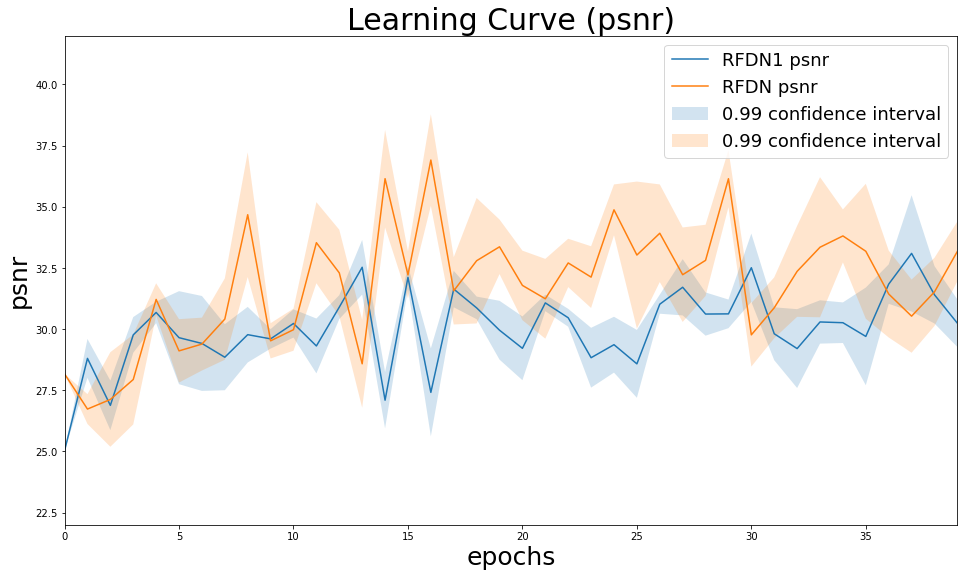

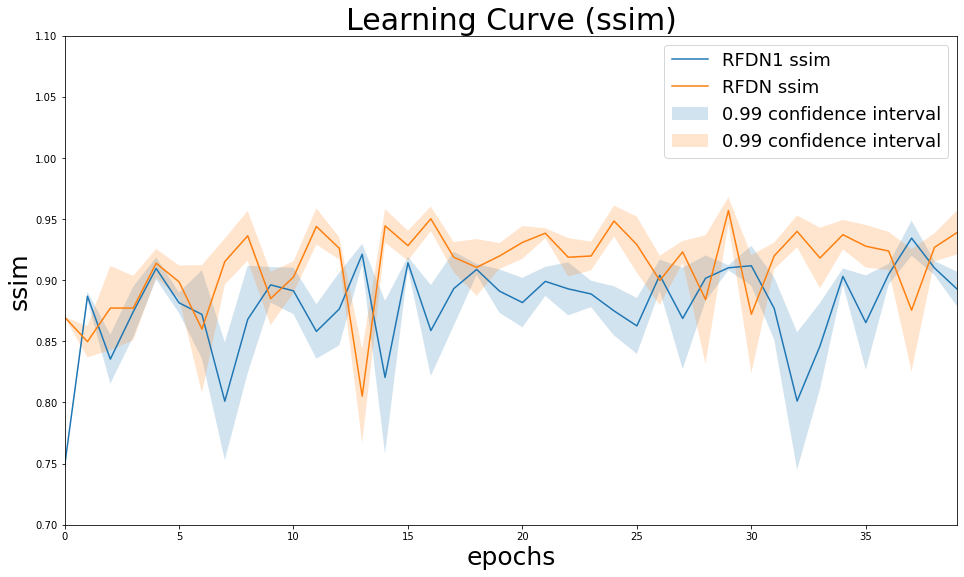

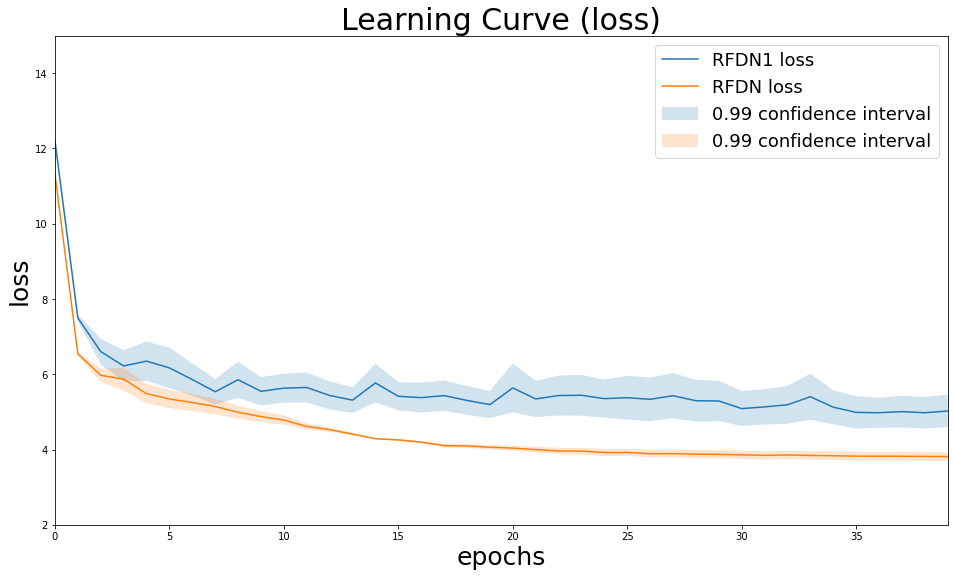

In [4]:
lc.plot("psnr", x=(0, 39), y=(22, 42), label="RFDN1", label2="RFDN")
lc.plot("ssim", x=(0, 39), y=(0.7, 1.1), label="RFDN1", label2="RFDN")
lc.plot("loss", x=(0, 39), y=(2, 15), confidence=0.99, label="RFDN1", label2="RFDN")

# Figure 2 and 3
Figures 2 and 3 compare the output of the RFDN and RFDN1 networks to the HR labels


In [5]:
# RFDN1
e = Evaluate(model1, checkpoint_file1, data_dir)

PSNR: 35.750933674448994
SSIM: 0.8271939158439636
Average Loss: 5.093774834459648


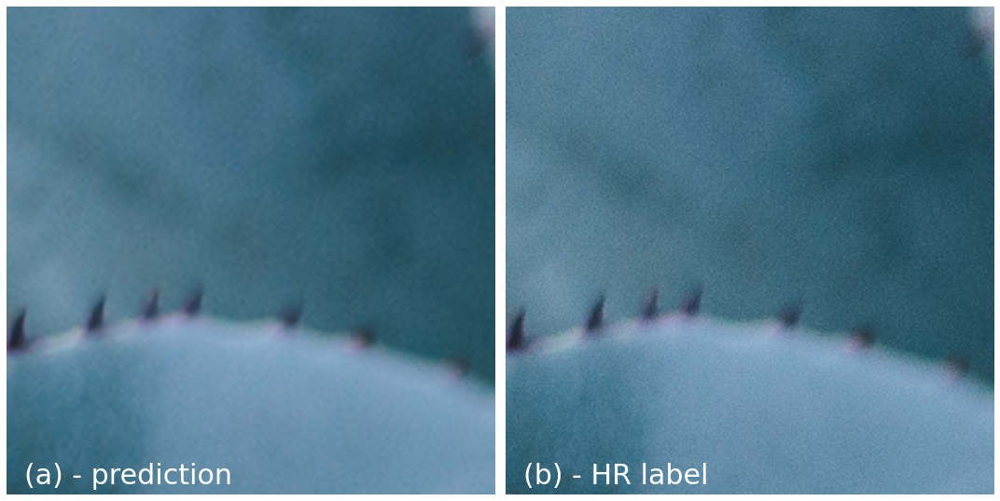

In [6]:
e.compare_patches(56, size=250, start=(110,200))
e.predict(56, img_name="", save_img=False)

PSNR: 26.18034292448521
SSIM: 0.8215885162353516
Average Loss: 5.093774834459648


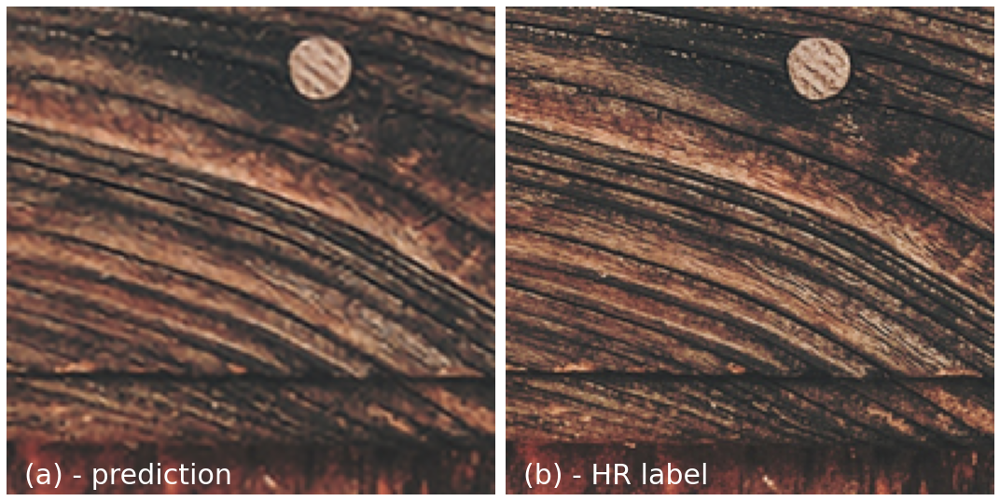

In [7]:
e.compare_patches(84, size=200, start=(700, 770))
e.predict(84, img_name="", save_img=False)

In [8]:
# RFDN
e2 = Evaluate(model2, checkpoint_file2, data_dir)

PSNR: 35.897698545165014
SSIM: 0.8268753886222839
Average Loss: 4.536314880115912


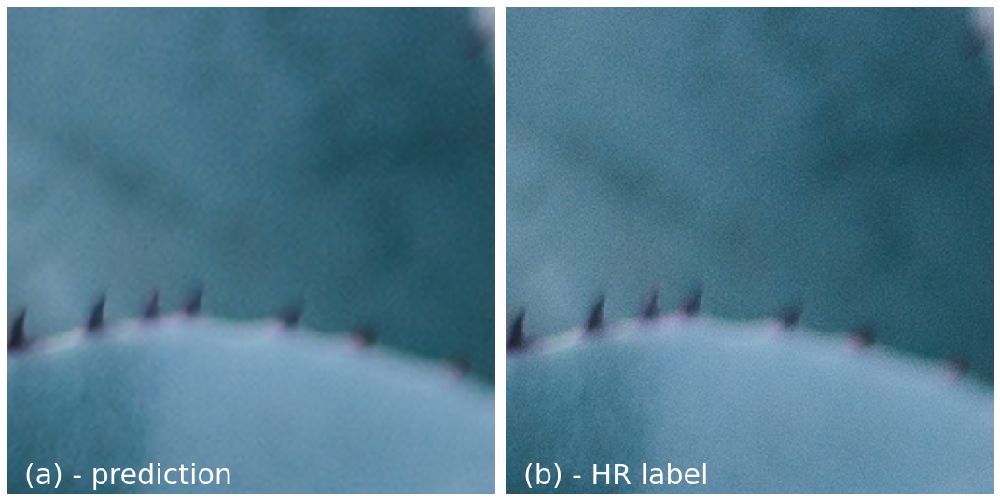

In [9]:
e2.compare_patches(56, size=250, start=(110,200))
e2.predict(56, img_name="", save_img=False)

PSNR: 26.333213845284305
SSIM: 0.8255494236946106
Average Loss: 4.536314880115912


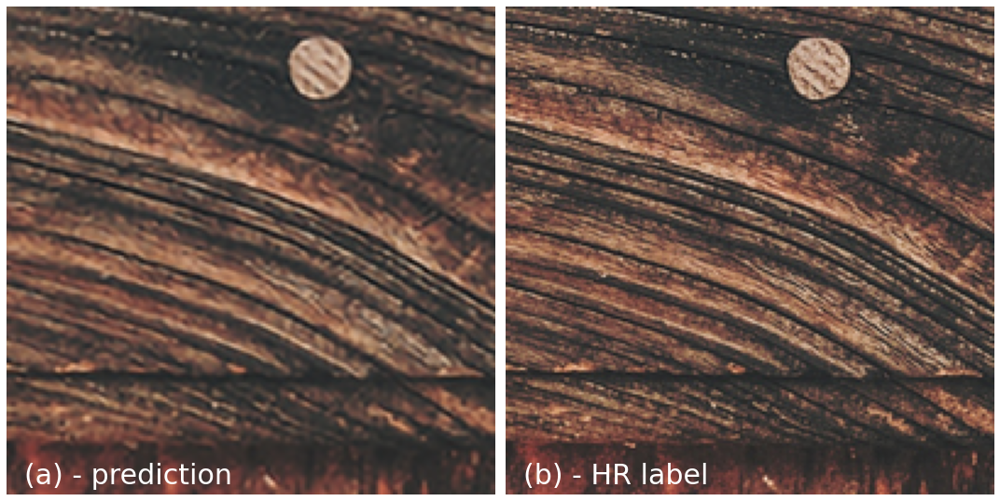

In [10]:
e2.compare_patches(84, size=200, start=(700, 770))
e2.predict(84, img_name="", save_img=False)

# Figures 4 and 5
Figures 4 and 5 show a comparison of the RFDN1 and RFDN outputs


In [11]:
comp = Compare(model1, model2, checkpoint_file1, checkpoint_file2, data_dir)

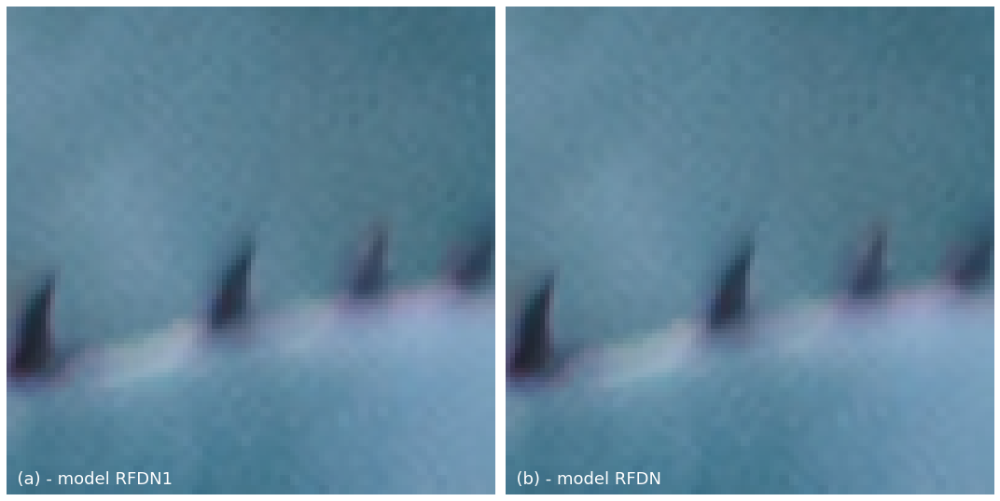

In [12]:
# You can see the shadow on the leaf in RFDN network better represented
comp.compare_patches(56, size=100, start=(210,200))

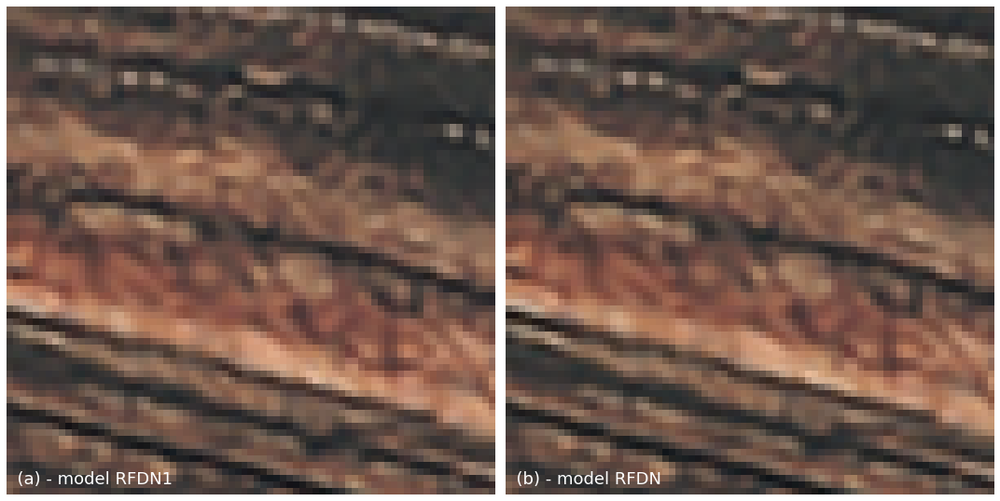

In [13]:
# Shadows in RFDN seems to be a bit better
comp.compare_patches(84, size=75, start=(700,770))

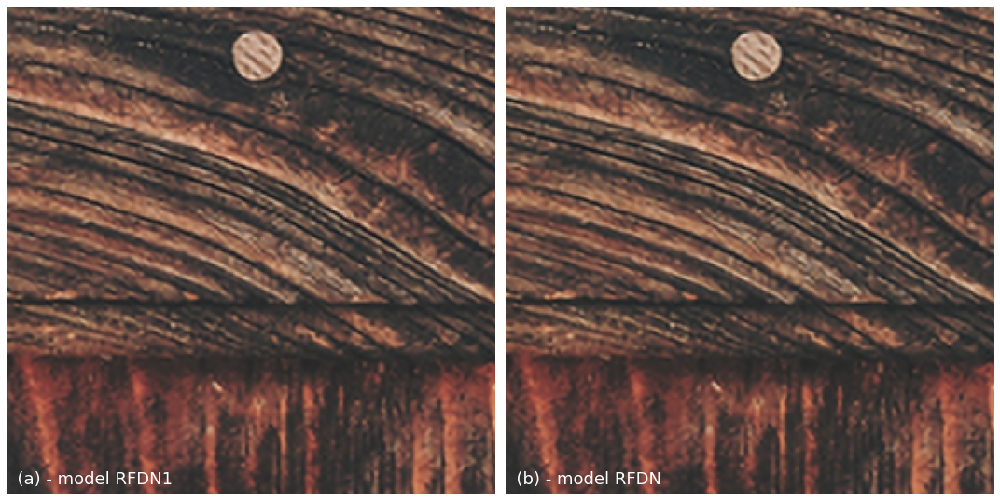

In [17]:
comp.compare_patches(84, size=250, start=(700,770))

# Figures - Interpolation vs RFDN/RFDN1
Here, we plot the figures comparing traditional interpolation techniques vs the RFDN and RFDN1 networks

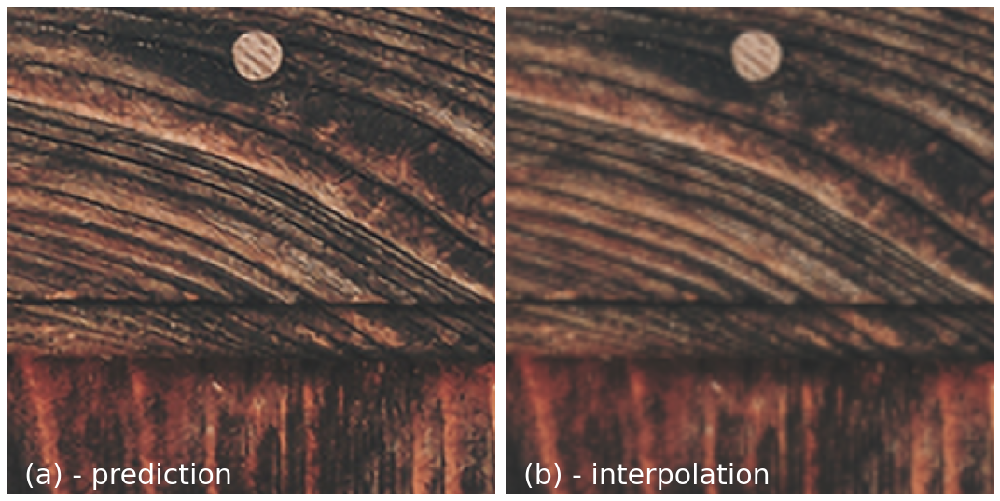

In [15]:
# RFDN1
e.compare_interpolation(84, size=250, start=(700,770))

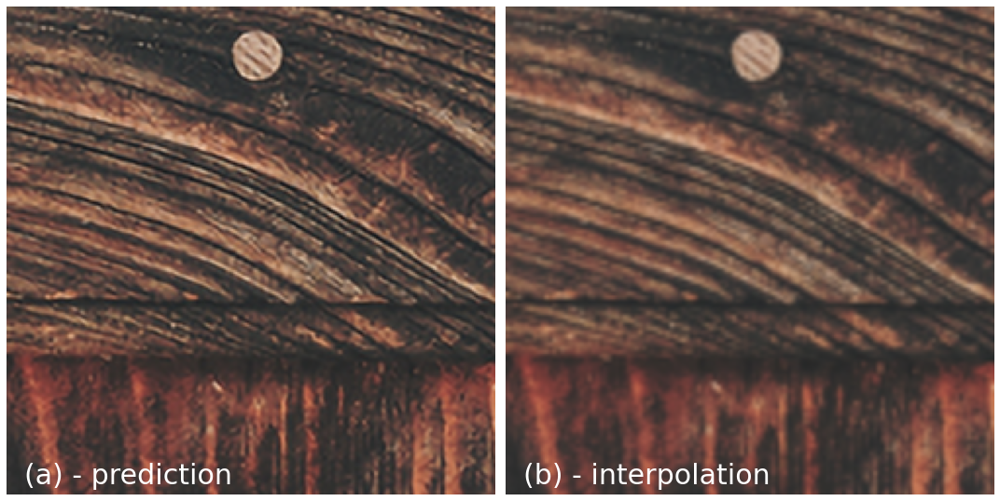

In [16]:
# RFDN
e2.compare_interpolation(84, size=250, start=(700,770))